## Client-No_churn

### Based on the dataset we have to build the model with best accuarcy rate wether the person will  churn or not.

In [4]:
pip install pymysql


Note: you may need to restart the kernel to use updated packages.


## importing necessary libraries

In [98]:
import pymysql
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')

In [99]:
#import data from mysql database
host = "18.136.157.135"  
user = "dm_team3"  
password = "DM!$!Team!27@9!20&"  
database = "project_telecom"

connection =pymysql.connect(host=host,user=user,password=password,database=database)

query = 'SELECT * FROM  telecom_churn_data'

df=pd.read_sql(query,connection)

connection.close()

print(df)

     columns1 columns2 columns3   columns4 columns5 columns6 columns7  \
0          KS      128      415   382-4657       no      yes       25   
1          OH      107      415   371-7191       no      yes       26   
2          NJ      137      415   358-1921       no       no        0   
3          OH       84      408   375-9999      yes       no        0   
4          OK       75      415   330-6626      yes       no        0   
...       ...      ...      ...        ...      ...      ...      ...   
4612       NY       57      510   345-7512       no      yes       25   
4613       NM      177      408   343-6820       no      yes       29   
4614       VT       67      408   338-4794       no      yes       33   
4615       MI       98      415   355-8388       no      yes       23   
4616       IN      140      415   409-6884       no       no        0   

     columns8 columns9 columns10  ... columns12 columns13 columns14 columns15  \
0       265.1      110     45.07  ...     

In [100]:
df

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [101]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   columns1   4617 non-null   object
 1   columns2   4617 non-null   object
 2   columns3   4617 non-null   object
 3   columns4   4617 non-null   object
 4   columns5   4617 non-null   object
 5   columns6   4617 non-null   object
 6   columns7   4617 non-null   object
 7   columns8   4617 non-null   object
 8   columns9   4617 non-null   object
 9   columns10  4617 non-null   object
 10  columns11  4617 non-null   object
 11  columns12  4617 non-null   object
 12  columns13  4617 non-null   object
 13  columns14  4617 non-null   object
 14  columns15  4617 non-null   object
 15  columns16  4617 non-null   object
 16  columns17  4617 non-null   object
 17  columns18  4617 non-null   object
 18  columns19  4617 non-null   object
 19  columns20  4617 non-null   object
 20  columns21  4617 non-null   obj

In [102]:
#add the column names.
df.columns = [
    'State', 'Account Length', 'Area Code', 'Phone', 'International Plan',
    'VMail Plan', 'VMail Message', 'Day Mins', 'Day Calls', 'Day Charge',
    'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins', 'Night Calls',
    'Night Charge', 'International Mins', 'International calls', 
    'International Charge', 'CustServ Calls', 'Churn'
]

In [103]:
df

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [104]:

# 3. Convert Data Types
df['Account Length'] = df['Account Length'].astype(int)
df['Area Code'] = df['Area Code'].astype(int)
df['VMail Message'] = df['VMail Message'].astype(int)
df['Day Mins'] = df['Day Mins'].astype(float)
df['Day Calls'] = df['Day Calls'].astype(int)
df['Day Charge'] = df['Day Charge'].astype(float)
df['Eve Mins'] = df['Eve Mins'].astype(float)
df['Eve Calls'] = df['Eve Calls'].astype(int)
df['Eve Charge'] = df['Eve Charge'].astype(float)
df['Night Mins'] = df['Night Mins'].astype(float)
df['Night Calls'] = df['Night Calls'].astype(int)
df['Night Charge'] = df['Night Charge'].astype(float)
df['International Mins'] = df['International Mins'].astype(float)
df['International calls'] = df['International calls'].astype(int)
df['International Charge'] = df['International Charge'].astype(float)
df['CustServ Calls'] = df['CustServ Calls'].astype(int)

In [105]:
df['Churn'].value_counts()

Churn
 False.    3961
 True.      656
Name: count, dtype: int64

In [106]:
df['Churn'] = df['Churn'].str.strip()

In [108]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 4617 non-null   object 
 1   Account Length        4617 non-null   int32  
 2   Area Code             4617 non-null   int32  
 3   Phone                 4617 non-null   object 
 4   International Plan    4617 non-null   object 
 5   VMail Plan            4617 non-null   object 
 6   VMail Message         4617 non-null   int32  
 7   Day Mins              4617 non-null   float64
 8   Day Calls             4617 non-null   int32  
 9   Day Charge            4617 non-null   float64
 10  Eve Mins              4617 non-null   float64
 11  Eve Calls             4617 non-null   int32  
 12  Eve Charge            4617 non-null   float64
 13  Night Mins            4617 non-null   float64
 14  Night Calls           4617 non-null   int32  
 15  Night Charge         

In [109]:
#basic checks
df.head()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [110]:
df.tail()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
4612,NY,57,510,345-7512,no,yes,25,144.0,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.30,3,False.
4613,NM,177,408,343-6820,no,yes,29,189.0,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13.0,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.
4616,IN,140,415,409-6884,no,no,0,204.7,100,34.80,...,107,10.78,202.8,115,9.13,12.1,4,3.27,2,False.


In [111]:
df.describe()

,Account Length,Area Code,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls
count,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000
mean,100.645224,437.046350,7.849903,180.447152,100.054364,30.676576,200.429088,100.179770,17.036703,200.623933,99.944120,9.028185,10.279294,4.433831,2.775926,1.567035
std,39.597194,42.288212,13.592333,53.983540,19.883027,9.177145,50.557001,19.821314,4.297332,50.543616,19.935053,2.274488,2.757361,2.457615,0.744413,1.307019
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,12.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,165.900000,87.000000,14.100000,167.100000,87.000000,7.520000,8.600000,3.000000,2.320000,1.000000
50%,100.000000,415.000000,0.000000,180.000000,100.000000,30.600000,200.800000,101.000000,17.070000,200.800000,100.000000,9.040000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,17.000000,216.800000,113.000000,36.860000,234.000000,114.000000,19.890000,234.900000,113.000000,10.570000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [112]:
df.describe(include='O')

,State,Phone,International Plan,VMail Plan,Churn
count,4617,4617,4617,4617,4617
unique,51,4617,2,2,2
top,WV,382-4657,no,no,False.
freq,149,1,4171,3381,3961


In [113]:
df.shape

(4617, 21)

In [114]:
num_cols = df.select_dtypes(include='number').columns
num_cols

Index(['Account Length', 'Area Code', 'VMail Message', 'Day Mins', 'Day Calls',
       'Day Charge', 'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins',
       'Night Calls', 'Night Charge', 'International Mins',
       'International calls', 'International Charge', 'CustServ Calls'],
      dtype='object')

In [115]:
cat_cols = df.select_dtypes(include="O").columns

### Exploratary data analysis(EDA)

In [116]:
# checking duplicates.
df.duplicated().sum()

0

In [117]:
#checking null values.
df.isnull().sum()

State                   0
Account Length          0
Area Code               0
Phone                   0
International Plan      0
VMail Plan              0
VMail Message           0
Day Mins                0
Day Calls               0
Day Charge              0
Eve Mins                0
Eve Calls               0
Eve Charge              0
Night Mins              0
Night Calls             0
Night Charge            0
International Mins      0
International calls     0
International Charge    0
CustServ Calls          0
Churn                   0
dtype: int64

## Univariate analysis

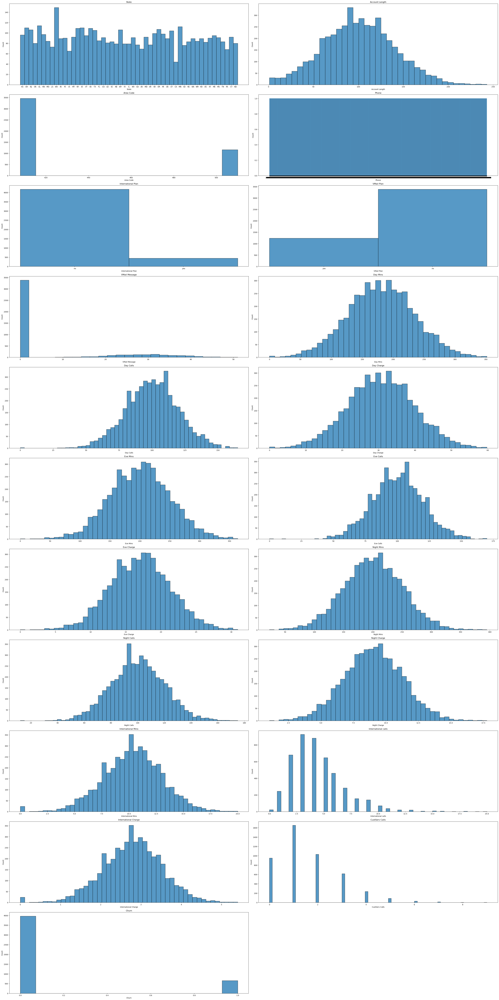

In [63]:
plt.figure(figsize=(40,80))
plot_num = 1
for i in df.columns:
    plt.subplot(11,2,plot_num)
    sns.histplot(df[i])
    plt.title(i)
    plot_num+=1
plt.tight_layout()    
    

#### 1.Churn:

"The plot reveals a clear imbalance in churn distribution, with significantly fewer customers who churn compared to those who don't. This indicates the majority of customers are retained, but understanding churn drivers is crucial for improving retention."

#### 2.Customer Service Calls:

"The majority of customers make very few service calls, but the plot shows a small group of customers with frequent calls. This could indicate dissatisfaction or recurring issues that need immediate attention."

#### 3.International Plan:

"Customers with an international plan are a minority. For churners, the adoption of this plan appears to have an impact, as a larger share of churners may not have opted for it. This could point to better retention strategies for international users."

#### 4.Account Length:

"The histogram shows a somewhat uniform distribution, suggesting no strong dependency of churn on account length. However, further analysis might reveal trends in specific ranges."

#### 5.Day, Evening, and Night Charges:

"Higher charges for day usage seem to coincide with increased churn rates, indicating that customers using more services during peak hours might feel overcharged."

#### 6.VMail Plan:

"Most customers lack a voicemail plan, as indicated by the bar graph. Its adoption is potentially less influential on churn but still worth investigating further."

## Bivariate analysis

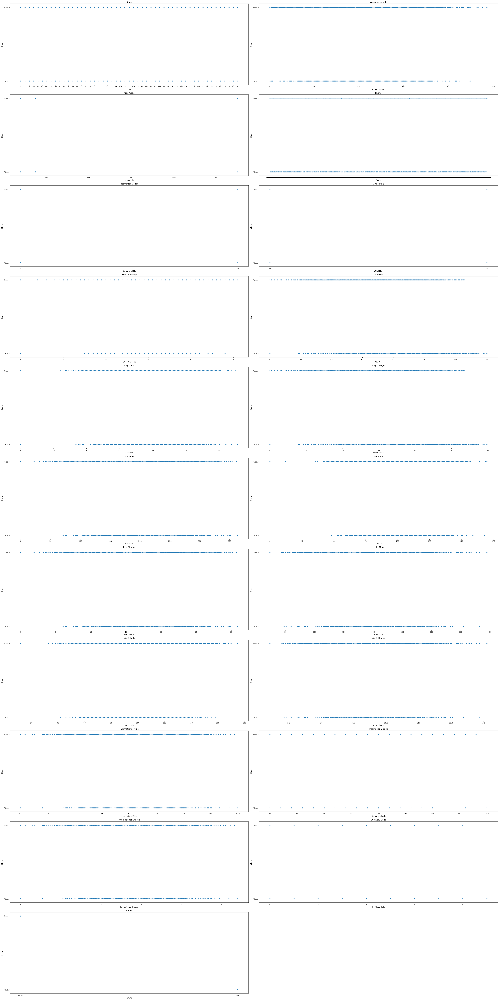

In [50]:
plt.figure(figsize=(40,80))
plot_num = 1
for i in df.columns:
    plt.subplot(11,2,plot_num)
    sns.scatterplot(x=df[i],y=df['Churn'])
    plt.title(i)
    plot_num+=1
plt.tight_layout()    
    

#### 1.Churn vs. International Plan:

"The plot shows that customers without an International Plan are more likely to churn compared to those with the plan. This highlights the potential role of the plan in improving customer retention."

#### 2.Churn vs. Customer Service Calls:

"Customers who churn often have a higher number of customer service calls. This suggests that unresolved issues or frequent complaints could be driving dissatisfaction and churn."

#### 3.Day Minutes vs. Churn:

"Customers who churn tend to have higher day minutes usage compared to non-churners. This could indicate dissatisfaction with billing or service for heavy users."

#### 4.Total Charge vs. Churn:

"Higher total charges correlate with increased churn, implying that customers paying more might be dissatisfied with the value they are receiving."

#### 5.Churn vs. VMail Plan:

"The plot reveals that most churners do not have a voicemail plan, suggesting that the feature might not be a key driver of retention."

#### 6.Area Code vs. Churn:

"The churn rate appears consistent across different area codes, indicating no significant geographical influence on customer churn."

## Multivariate analysis.

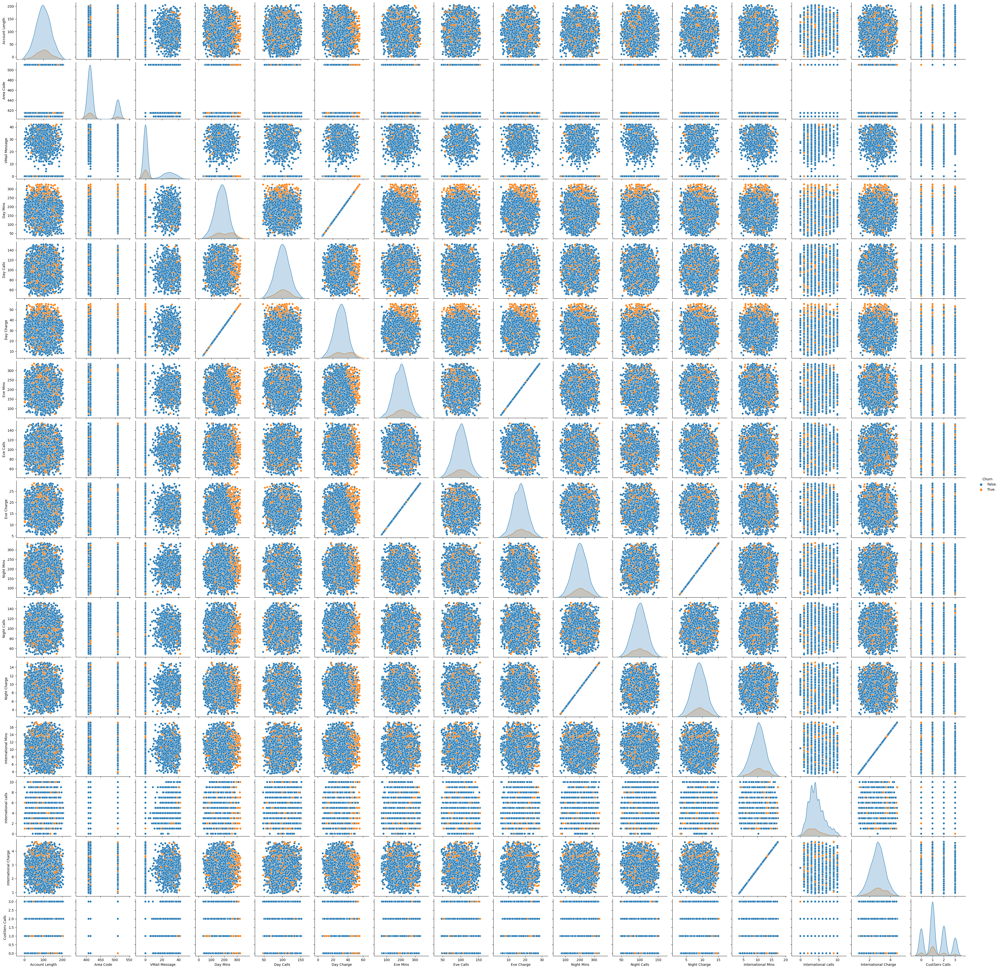

In [41]:
sns.pairplot(df, hue='Churn')
plt.show()


#### 1.Churn vs. International Plan and Total Charges:

"Customers with an international plan and higher total charges exhibit a higher churn rate. This suggests that dissatisfaction might stem from perceived overcharging or insufficient value."

#### 2.Churn vs. Customer Service Calls and Account Length:

"Customers with frequent customer service calls and shorter account lengths have a higher likelihood of churn. This could imply issues faced early in the customer lifecycle lead to dissatisfaction."

#### 3.Churn vs. Day Minutes and Night Calls:

"Heavy day minutes usage, combined with a high number of night calls, correlates with increased churn rates. These customers might represent high activity users who are dissatisfied with the pricing or service quality."

#### 4.Churn vs. International Plan and VMail Plan:

"Churners who lack both an international plan and a voicemail plan suggest that these features could serve as potential retention drivers if made more appealing."

#### 5.Total Charges vs. Day Minutes and Churn:

"A positive correlation between total charges and day minutes aligns with higher churn rates. It highlights a trend where high-usage customers are more likely to leave, possibly due to cost concerns."

#### 6.Churn vs. State and Total Charges:

"Certain states show higher churn rates among customers with higher total charges, which may reflect region-specific issues or competitive pressures."

#### 7.Churn vs. International Calls and Charges:

"A higher churn rate is observed for customers with substantial international minutes and charges, which could indicate dissatisfaction with international pricing or package offerings."

## Identifing the outliers

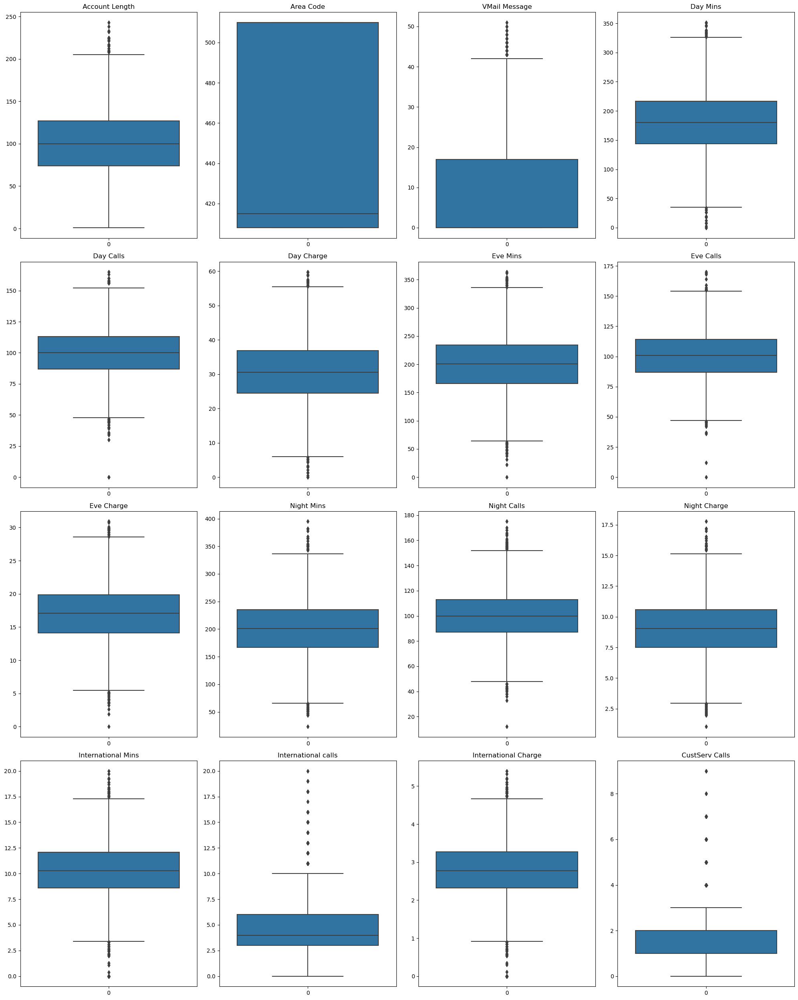

In [48]:
plt.figure(figsize=(20,25))
plot_num = 1
for i in num_cols:
    plt.subplot(4,4,plot_num)
    sns.boxplot(df[i])
    plt.title(i)
    plot_num+=1
plt.tight_layout()    
    

## Handiling outliers

In [118]:
import numpy as np  # Ensure numpy is imported

for i in num_cols:
    q1 = df[i].quantile(0.25)
    q3 = df[i].quantile(0.75)
    iqr = q3 - q1
    upper_bound = q3 + 1.5 * iqr
    lower_bound = q1 - 1.5 * iqr
    df[i] = np.where((df[i] < lower_bound) | (df[i] > upper_bound), df[i].median(), df[i])

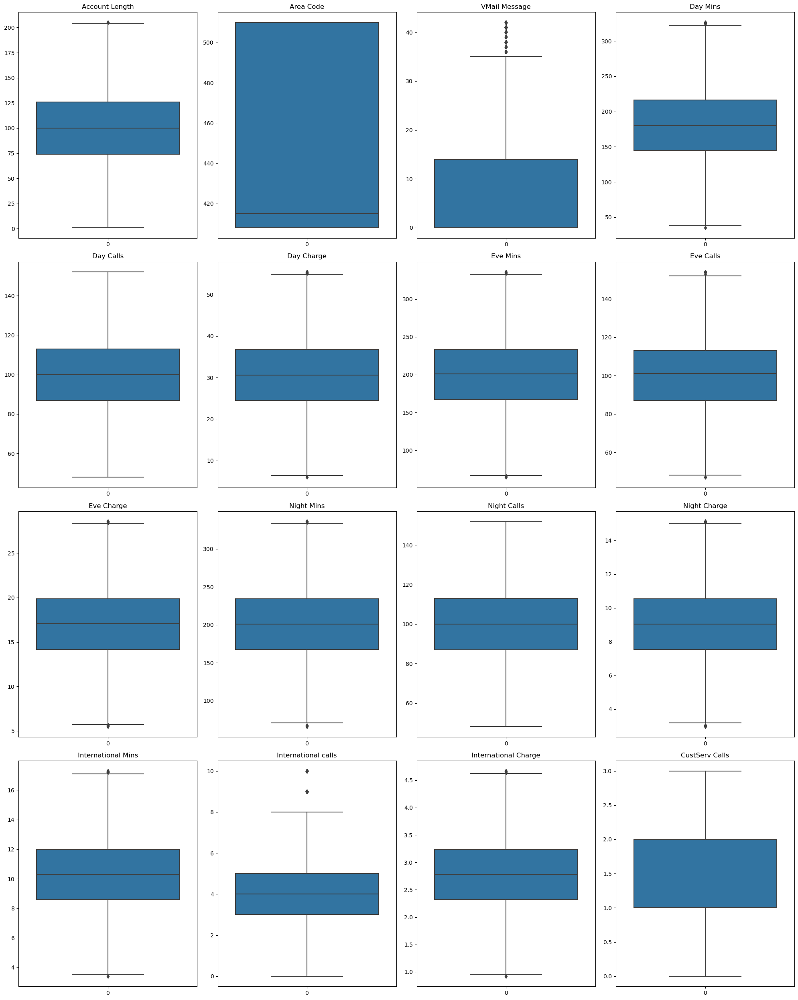

In [39]:
#checking outliers handled or not
plt.figure(figsize=(20,25))
plot_num = 1
for i in num_cols:
    plt.subplot(4,4,plot_num)
    sns.boxplot(df[i])
    plt.title(i)
    plot_num+=1
plt.tight_layout()  

#### 1.Before Outlier Handling:

"Boxplots revealed the presence of outliers in variables such as Day Mins, International Mins, and CustServ Calls. These extreme values, if left unaddressed, could skew statistical measures and negatively impact model performance."

#### 2.Outlier Identification Process:

"The IQR (Interquartile Range) method was applied to identify outliers. Values beyond Q1 - 1.5IQR or Q3 + 1.5IQR were considered outliers and replaced."

#### 3.Outlier Handling Technique:

"To mitigate the influence of outliers without losing valuable data, these extreme values were replaced with the median of their respective columns. This approach preserved the data's overall structure while stabilizing distributions."

#### 4.Post-Outlier Handling Observations:

"After handling outliers, updated boxplots demonstrated the absence of extreme values, ensuring cleaner data for training models. This process helped reduce variability and potential noise in the data."

#### 5.Impact on Data Integrity:

"By replacing outliers instead of removing them, key trends and relationships in the dataset were preserved. This ensures that predictive models built on this data are both accurate and robust."

In [119]:
df['Churn'].value_counts()

Churn
False.    3961
True.      656
Name: count, dtype: int64

In [120]:
# Create a new column for Total Charge
df['Total Charge'] = df['Day Charge'] + df['Eve Charge'] + df['Night Charge']


In [121]:
#before data preprocessing we have to remove phone column because it contains full of unique values
df.drop('Phone',axis=1,inplace=True)

In [122]:
cat_cols = df.select_dtypes(include = 'O').columns
cat_cols

Index(['State', 'International Plan', 'VMail Plan', 'Churn'], dtype='object')

## Data preprocessing 

In [123]:
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
for i in cat_cols:
    df[i]=enc.fit_transform(df[i])

In [124]:
# Scaling the numerical data
from sklearn.preprocessing import StandardScaler

# Select numerical columns
num_cols = ['Account Length', 'Day Mins', 'Day Calls', 'Day Charge', 
            'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins', 
            'Night Calls','Night Charge','International Mins', 
            'International calls', 'International Charge', 'CustServ Calls', 
            'Total Charge']

# Initialize the scaler
scaler = StandardScaler()

# Scale the data
df[num_cols] = scaler.fit_transform(df[num_cols])


In [125]:
df

,State,Account Length,Area Code,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,...,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn,Total Charge
0,16,0.722804,415.0,0,1,25.0,1.609731,0.511593,1.610020,-0.065339,...,-0.065158,0.905211,-0.461999,0.904454,-0.12704,-0.596661,-0.127784,-0.302543,0,1.604085
1,35,0.179794,415.0,0,1,26.0,-0.359581,1.190052,-0.359870,-0.104328,...,-0.103784,1.104506,0.166385,1.105346,1.32558,-0.596661,1.326473,-0.302543,0,-0.122002
2,31,0.955522,415.0,0,0,0.0,1.196841,0.720350,1.197014,-1.628983,...,-1.629530,-0.781613,0.218750,-0.780301,0.73668,0.375215,0.730228,-1.367210,0,0.222817
3,35,-0.414932,408.0,1,0,0.0,2.262363,-1.523782,2.262546,0.004429,...,0.004853,-0.076886,-0.566730,-0.077178,-1.46188,1.347092,-1.465700,0.762123,0,1.999730
4,36,-0.647650,415.0,1,0,0.0,-0.262542,0.668161,-0.262495,-1.072884,...,-1.071860,-0.282346,1.108961,-0.282636,-0.08778,-0.596661,-0.084156,1.826789,0,-0.737892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,34,-1.113088,510.0,0,1,25.0,-0.694459,-1.001891,-0.694527,-0.274646,...,-0.275189,-0.863797,1.161327,-0.862484,-0.71594,0.861154,-0.709486,1.826789,0,-0.920267
4613,32,1.989827,408.0,0,1,29.0,0.161763,-0.480000,0.161703,2.103651,...,2.102754,-0.761067,0.847135,-0.762038,2.11078,-1.568537,2.111771,1.826789,0,0.845683
4614,46,-0.854511,408.0,0,1,33.0,-1.008407,1.346619,-1.007919,1.960009,...,1.960319,0.005297,-0.461999,0.005005,1.05076,-0.596661,1.050164,-0.302543,0,-0.087122
4615,22,-0.052925,415.0,0,1,23.0,-0.220683,-0.114676,-0.221082,0.527696,...,0.528725,-0.722030,-0.200172,-0.720946,1.56114,-0.596661,1.559154,-1.367210,0,-0.135954


## Feature engineering.

In [126]:
corr = df.corr()
corr

,State,Account Length,Area Code,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,...,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn,Total Charge
State,1.000000,0.003369,0.015370,0.009789,-0.033323,-0.030435,0.011545,-0.003384,0.011546,0.010979,...,0.010971,0.011836,-0.003417,0.011825,-0.010114,0.006763,-0.010160,-0.007821,0.010979,0.017391
Account Length,0.003369,1.000000,-0.022754,0.016989,0.000179,-0.009659,-0.002189,0.031274,-0.002194,-0.010543,...,-0.010535,-0.005915,-0.005694,-0.005932,0.021392,0.026259,0.021401,-0.013078,0.015501,-0.007597
Area Code,0.015370,-0.022754,1.000000,0.039263,-0.003150,0.000568,-0.022268,-0.014021,-0.022272,0.004241,...,0.004261,0.003667,0.007892,0.003653,-0.007085,0.002328,-0.007197,0.034860,0.011995,-0.017274
International Plan,0.009789,0.016989,0.039263,1.000000,0.009278,0.009662,0.026369,0.007385,0.026372,0.018929,...,0.018931,-0.031589,0.009948,-0.031598,0.030535,0.005122,0.030516,-0.024775,0.257524,0.024399
VMail Plan,-0.033323,0.000179,-0.003150,0.009278,1.000000,0.933469,0.011340,-0.005971,0.011338,0.019178,...,0.019181,0.000012,0.012584,0.000006,0.000124,-0.012035,0.000167,-0.022515,-0.110149,0.018015
VMail Message,-0.030435,-0.009659,0.000568,0.009662,0.933469,1.000000,0.015710,-0.010015,0.015707,0.024518,...,0.024519,-0.000858,0.001899,-0.000866,0.005776,0.002105,0.005809,-0.011658,-0.096228,0.023918
Day Mins,0.011545,-0.002189,-0.022268,0.026369,0.011340,0.015710,1.000000,0.006498,1.000000,-0.006319,...,-0.006328,-0.003948,-0.000076,-0.003963,-0.013215,-0.004331,-0.013168,-0.010809,0.185451,0.886923
Day Calls,-0.003384,0.031274,-0.014021,0.007385,-0.005971,-0.010015,0.006498,1.000000,0.006501,-0.003683,...,-0.003680,0.016001,-0.007133,0.015996,0.007097,0.000629,0.007230,-0.023141,0.018311,0.007761
Day Charge,0.011546,-0.002194,-0.022272,0.026372,0.011338,0.015707,1.000000,0.006501,1.000000,-0.006314,...,-0.006323,-0.003946,-0.000078,-0.003962,-0.013216,-0.004329,-0.013169,-0.010813,0.185445,0.886926
Eve Mins,0.010979,-0.010543,0.004241,0.018929,0.019178,0.024518,-0.006319,-0.003683,-0.006314,1.000000,...,1.000000,-0.025950,0.008206,-0.025965,-0.000516,0.008623,-0.000500,-0.026423,0.077579,0.401520


In [127]:
corr[corr>0.8]

,State,Account Length,Area Code,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,...,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn,Total Charge
State,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Account Length,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Area Code,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
International Plan,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
VMail Plan,NaN,NaN,NaN,NaN,1.000000,0.933469,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
VMail Message,NaN,NaN,NaN,NaN,0.933469,1.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Day Mins,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,1.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.886923
Day Calls,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Day Charge,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,1.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.886926
Eve Mins,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


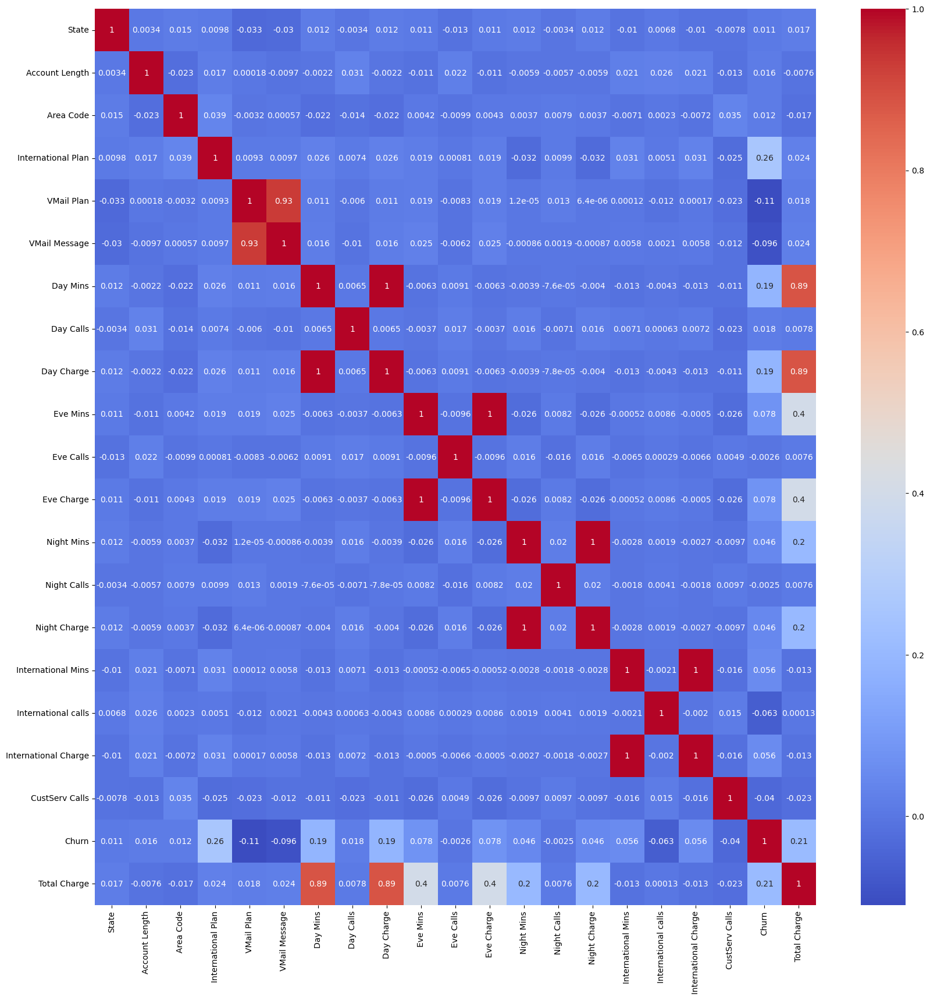

In [30]:
plt.figure(figsize=(20,20))
sns.heatmap(corr,annot=True,cmap='coolwarm')
plt.show()

In [128]:
#Based on the correlation matrix the Vmailmessages and vmailplan columns have correlated highly so we have to delete one of that.
df.drop('VMail Message',axis=1,inplace=True)

Variables such as VMail Plan and VMail Message showed high correlation (above 0.93). To address this redundancy, one of these variables (VMail Message) was dropped, simplifying the data and reducing the risk of multicollinearity in the model.



In [129]:
df['Churn'].value_counts()

Churn
0    3961
1     656
Name: count, dtype: int64

## Data splitting.

In [130]:
x = df.drop('Churn',axis=1)
y = df['Churn']

In [131]:
# using smote fucttion to balancing the data because data is imbalanced.
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
x_resampled,y_resampled = smote.fit_resample(x,y)

In [132]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x_resampled,y_resampled,test_size=0.2,random_state=42)

In [133]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(6337, 19)
(1585, 19)
(6337,)
(1585,)


# Model creation
## Logistic reggression

In [37]:
from  sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import GridSearchCV
logistic = LogisticRegression()
logistic.fit(x_train,y_train)


LogisticRegression()

In [38]:
#traing accuracy 
trainig_pred = logistic.predict(x_train)

l_training_accuracy =accuracy_score(y_train,trainig_pred)
l_training_accuracy

0.6635632002524854

In [39]:
logistic_pred = logistic.predict(x_test)

In [40]:
logistic_accuracy = accuracy_score(y_test,logistic_pred)
logistic_accuracy

0.6574132492113565

In [41]:
print(confusion_matrix(y_test,logistic_pred))

[[492 333]
 [210 550]]


In [42]:
print(classification_report(y_test,logistic_pred))

              precision    recall  f1-score   support

           0       0.70      0.60      0.64       825
           1       0.62      0.72      0.67       760

    accuracy                           0.66      1585
   macro avg       0.66      0.66      0.66      1585
weighted avg       0.66      0.66      0.66      1585



## Hyper parameter tunning for logistic regression

In [143]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'C':[0.01,0.1,1,10,100],
    'penalty':['l1','l2'],
    'solver':['lbfgs','liblinear','saga']
}

grid_search = GridSearchCV(estimator=logistic,param_grid=param_grid,cv=5,scoring='accuracy')

grid_search.fit(x_train,y_train)

grid_search.best_params_


{'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}

In [43]:
best_params ={'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}

hyper_logistic = LogisticRegression(**best_params)
hyper_logistic.fit(x_train,y_train)

hyper_logistic_pred = hyper_logistic.predict(x_test)

In [44]:
hyper_logistic_accuracy = accuracy_score(y_test,hyper_logistic_pred)
hyper_logistic_accuracy

0.6599369085173502

In [45]:
confusion_matrix(y_test,hyper_logistic_pred)

array([[496, 329],
       [210, 550]], dtype=int64)

In [46]:
pd.crosstab(y_test,hyper_logistic_pred)

col_0,0,1
Churn,,
0,496,329
1,210,550


In [47]:
print(classification_report(y_test,hyper_logistic_pred))

              precision    recall  f1-score   support

           0       0.70      0.60      0.65       825
           1       0.63      0.72      0.67       760

    accuracy                           0.66      1585
   macro avg       0.66      0.66      0.66      1585
weighted avg       0.67      0.66      0.66      1585



## Decision tree

In [48]:
from sklearn.tree import DecisionTreeClassifier
decision =DecisionTreeClassifier(random_state=42)
decision.fit(x_train,y_train)

DecisionTreeClassifier(random_state=42)

In [49]:
#Decision tree training accuracy 
decision_training_pred = decision.predict(x_train)

decision_training_accuracy= accuracy_score(y_train,decision_training_pred)
decision_training_accuracy

1.0

In [50]:
decision_pred = decision.predict(x_test)

In [51]:
decision_accuracy = accuracy_score(y_test,decision_pred)
decision_accuracy

0.8921135646687697

In [52]:
print(confusion_matrix(y_test,decision_pred))

[[722 103]
 [ 68 692]]


In [53]:
pd.crosstab(y_test,decision_pred)

col_0,0,1
Churn,,
0,722,103
1,68,692


In [54]:
print(classification_report(y_test,decision_pred))

              precision    recall  f1-score   support

           0       0.91      0.88      0.89       825
           1       0.87      0.91      0.89       760

    accuracy                           0.89      1585
   macro avg       0.89      0.89      0.89      1585
weighted avg       0.89      0.89      0.89      1585



## Hyperparameter tunning for decision tree.

In [144]:
param_grid = {
    'max_depth':[3,5,10,None],
    'min_samples_split':[2,5,10],
    'min_samples_leaf':[1,5,10],
    'criterion':['gini','entropy']
}

grid_search = GridSearchCV(estimator=decision,param_grid=param_grid,cv=5,scoring='accuracy')

grid_search.fit(x_train,y_train)

best_params = grid_search.best_params_

In [145]:
best_params

{'criterion': 'entropy',
 'max_depth': None,
 'min_samples_leaf': 1,
 'min_samples_split': 5}

In [146]:
best_params = {'criterion': 'entropy',
 'max_depth': None,
 'min_samples_leaf': 1,
 'min_samples_split': 5}

hyper_decision = DecisionTreeClassifier(**best_params)

hyper_decision.fit(x_train,y_train)

hyper_decision_pred = hyper_decision.predict(x_test)

In [147]:
hyper_decision_accuracy = accuracy_score(y_test,hyper_decision_pred)
hyper_decision_accuracy

0.8958990536277602

In [148]:
pd.crosstab(y_test,hyper_logistic_pred)

col_0,0,1
Churn,,
0,496,329
1,210,550


In [149]:
confusion_matrix(y_test,hyper_logistic_pred)

array([[496, 329],
       [210, 550]], dtype=int64)

In [150]:
print(classification_report(y_test,hyper_logistic_pred))

              precision    recall  f1-score   support

           0       0.70      0.60      0.65       825
           1       0.63      0.72      0.67       760

    accuracy                           0.66      1585
   macro avg       0.66      0.66      0.66      1585
weighted avg       0.67      0.66      0.66      1585



## Random forest classifier

In [151]:
from sklearn.ensemble import RandomForestClassifier
random = RandomForestClassifier(n_estimators=100,random_state=42)
random.fit(x_train,y_train)

RandomForestClassifier(random_state=42)

In [152]:
#Random_forest trainning accuracy
random_training_pred = random.predict(x_train)

random_training_accuracy = accuracy_score(y_train,random_training_pred)
random_training_accuracy

1.0

In [153]:
random_pred = random.predict(x_test)

In [154]:
random_accuracy = accuracy_score(y_test,random_pred)
random_accuracy

0.9463722397476341

In [155]:
confusion_matrix(y_test,random_pred)

array([[799,  26],
       [ 59, 701]], dtype=int64)

In [156]:
pd.crosstab(y_test,random_pred)

col_0,0,1
Churn,,
0,799,26
1,59,701


In [157]:
print(classification_report(y_test,random_pred))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95       825
           1       0.96      0.92      0.94       760

    accuracy                           0.95      1585
   macro avg       0.95      0.95      0.95      1585
weighted avg       0.95      0.95      0.95      1585



## Hyper parametertunning for Random forest.

In [158]:
param_grid = {
    'n_estimators':[50,100,200],
    'max_depth':[None,5,10,20],
    'min_samples_split':[2,5,10],
    'min_samples_leaf':[1,2,4],
    'max_features':['sqrt','log2']
}

grid_search = GridSearchCV(estimator=random,param_grid=param_grid,cv=5,scoring='accuracy',verbose=2,n_jobs=-1)

grid_search.fit(x_train,y_train)

best_params = grid_search.best_params_

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


In [68]:
best_params={'max_depth': None,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}
hyper_random = RandomForestClassifier(**best_params,random_state = 42)
hyper_random.fit(x_train,y_train)
hyper_random_pred = hyper_random.predict(x_test)

In [69]:
hyper_random_accuracy = accuracy_score(y_test,hyper_random_pred)
hyper_random_accuracy

0.9495268138801262

In [70]:
pd.crosstab(y_test,hyper_random_pred)

col_0,0,1
Churn,,
0,803,22
1,58,702


In [71]:
confusion_matrix(y_test,hyper_random_pred)

array([[803,  22],
       [ 58, 702]], dtype=int64)

In [72]:
print(classification_report(y_test,hyper_random_pred))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95       825
           1       0.97      0.92      0.95       760

    accuracy                           0.95      1585
   macro avg       0.95      0.95      0.95      1585
weighted avg       0.95      0.95      0.95      1585



## Gradientboosting 

In [73]:
from sklearn.ensemble import GradientBoostingClassifier
GB = GradientBoostingClassifier(random_state=42)
GB.fit(x_train,y_train)

GradientBoostingClassifier(random_state=42)

In [74]:
#Gradient Boosting tarinning accuracy score
GB_training_pred = GB.predict(x_train)

GB_trainning_accuracy = accuracy_score(y_train,GB_training_pred)
GB_trainning_accuracy

0.9373520593340697

In [75]:
GB_pred = GB.predict(x_test)

In [76]:
GB_accuracy = accuracy_score(y_test,GB_pred)
GB_accuracy

0.9324921135646688

In [77]:
pd.crosstab(y_test,GB_pred)

col_0,0,1
Churn,,
0,804,21
1,86,674


In [78]:
confusion_matrix(y_test,GB_pred)

array([[804,  21],
       [ 86, 674]], dtype=int64)

In [79]:
print(classification_report(y_test,GB_pred))

              precision    recall  f1-score   support

           0       0.90      0.97      0.94       825
           1       0.97      0.89      0.93       760

    accuracy                           0.93      1585
   macro avg       0.94      0.93      0.93      1585
weighted avg       0.94      0.93      0.93      1585



## Hyperparameter tunning for Gradientboosting

In [159]:
param_grid = {
    'n_estimators':[100,200,300],
    'learning_rate':[0.01,0.1,0.2],
    'max_depth':[3,5,7],
    'min_samples_split':[2,5,10],
    'min_samples_leaf':[1,2,4],
    'max_features':['sqrt','log2']
}

grid_search = GridSearchCV(estimator=GB,param_grid=param_grid,cv=5,scoring='accuracy',verbose=2,n_jobs=-1)

grid_search.fit(x_train,y_train)

best_params = grid_search.best_params_

best_params

Fitting 5 folds for each of 486 candidates, totalling 2430 fits


{'learning_rate': 0.2,
 'max_depth': 7,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 300}

In [160]:
best_params = {'learning_rate': 0.2,
 'max_depth': 7,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 300}
hyper_GB = GradientBoostingClassifier(**best_params,random_state= 42)
hyper_GB.fit(x_train,y_train)
hyper_GB_pred = hyper_GB.predict(x_test)

In [82]:
hyper_GB_accuracy = accuracy_score(y_test,hyper_GB_pred)
hyper_GB_accuracy

0.9615141955835962

## XGBoosting classifier

In [83]:
import xgboost as xgb
xgb = xgb.XGBClassifier(objective='binary:logistic',max_depth = 6,learning_rate = 0.1,n_estimators = 100,random_state=42)
xgb.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [84]:
#xgb trainning accuracy 
xgb_trainning_pred = xgb.predict(x_train)

xgb_trainning_accuracy = accuracy_score(y_train,xgb_trainning_pred)
xgb_trainning_accuracy

0.9736468360422913

In [85]:
xgb_pred = xgb.predict(x_test)

In [86]:
xgb_accuracy = accuracy_score(y_test,xgb_pred)
xgb_accuracy

0.9495268138801262

In [87]:
pd.crosstab(y_test,xgb_pred)

col_0,0,1
Churn,,
0,810,15
1,65,695


In [88]:
confusion_matrix(y_test,xgb_pred)

array([[810,  15],
       [ 65, 695]], dtype=int64)

In [89]:
print(classification_report(y_test,xgb_pred))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95       825
           1       0.98      0.91      0.95       760

    accuracy                           0.95      1585
   macro avg       0.95      0.95      0.95      1585
weighted avg       0.95      0.95      0.95      1585



## Accuracy Visualization

In [90]:
accuracy  = {
    'Logistic':0.6574132492113565,
    'Hyper_logistic':0.6599369085173502,
    'Decision_tree':0.8921135646687697,
    'Hyper_Decision':0.8958990536277602,
    'Random_Forest':0.9463722397476341,
    'Hyper_random':0.9495268138801262,
    'GBoosting':0.9324921135646688,
    'Hyper_GB':0.9615141955835962,
    'XGB':0.9495268138801262
}
keys = list(accuracy.keys())
values = list(accuracy.values())

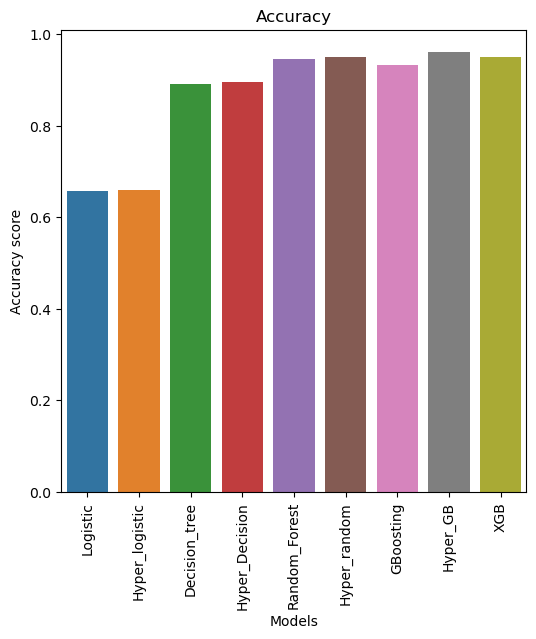

In [91]:
plt.figure(figsize=(6,6))
sns.barplot(x=keys,y=values)
plt.xticks(rotation=90)
plt.title('Accuracy')
plt.xlabel('Models')
plt.ylabel('Accuracy score')
plt.show()

In [134]:
accuracy= pd.DataFrame(list(accuracy.items()), columns=['Model', 'Accuracy'])
accuracy.sort_values(by ="Accuracy",ascending=False)


,Model,Accuracy
7,Hyper_GB,0.961514
5,Hyper_random,0.949527
8,XGB,0.949527
4,Random_Forest,0.946372
6,GBoosting,0.932492
3,Hyper_Decision,0.895899
2,Decision_tree,0.892114
1,Hyper_logistic,0.659937
0,Logistic,0.657413


based on the accuracy plot hyperparameter tuned Gradientboosting model has high accuracy ever.
the accuracy of 96%.

### Creating Churnflag

In [136]:
df.loc[df['Churn'] == 1, 'Churn_Flag'] = 'Yes'
df.loc[df['Churn'] == 0, 'Churn_Flag'] = 'No'

In [141]:
df

,State,Account Length,Area Code,International Plan,VMail Plan,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,...,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn,Total Charge,Churn_Flag
0,16,0.722804,415.0,0,1,1.609731,0.511593,1.610020,-0.065339,-0.062503,...,0.905211,-0.461999,0.904454,-0.12704,-0.596661,-0.127784,-0.302543,0,1.604085,No
1,35,0.179794,415.0,0,1,-0.359581,1.190052,-0.359870,-0.104328,0.144919,...,1.104506,0.166385,1.105346,1.32558,-0.596661,1.326473,-0.302543,0,-0.122002,No
2,31,0.955522,415.0,0,0,1.196841,0.720350,1.197014,-1.628983,0.507908,...,-0.781613,0.218750,-0.780301,0.73668,0.375215,0.730228,-1.367210,0,0.222817,No
3,35,-0.414932,408.0,1,0,2.262363,-1.523782,2.262546,0.004429,-0.632913,...,-0.076886,-0.566730,-0.077178,-1.46188,1.347092,-1.465700,0.762123,0,1.999730,No
4,36,-0.647650,415.0,1,0,-0.262542,0.668161,-0.262495,-1.072884,1.130174,...,-0.282346,1.108961,-0.282636,-0.08778,-0.596661,-0.084156,1.826789,0,-0.737892,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,34,-1.113088,510.0,0,1,-0.694459,-1.001891,-0.694527,-0.274646,0.611619,...,-0.863797,1.161327,-0.862484,-0.71594,0.861154,-0.709486,1.826789,0,-0.920267,No
4613,32,1.989827,408.0,0,1,0.161763,-0.480000,0.161703,2.103651,-0.218069,...,-0.761067,0.847135,-0.762038,2.11078,-1.568537,2.111771,1.826789,0,0.845683,No
4614,46,-0.854511,408.0,0,1,-1.008407,1.346619,-1.007919,1.960009,1.493162,...,0.005297,-0.461999,0.005005,1.05076,-0.596661,1.050164,-0.302543,0,-0.087122,No
4615,22,-0.052925,415.0,0,1,-0.220683,-0.114676,-0.221082,0.527696,0.870896,...,-0.722030,-0.200172,-0.720946,1.56114,-0.596661,1.559154,-1.367210,0,-0.135954,No


#### Based on accuracy score we can use Hyperparameter Gradient-boosting model for predict the output because it has highest accuracy of 96.15%